In [ ]:
import os

# 기본 경로 설정
ROOT_DIR = os.path.dirname(os.getcwd())
DATA_DIR = os.path.join(ROOT_DIR, "data")
IMAGE_DIR = os.path.join(DATA_DIR, "train_images")
ANNOT_DIR = os.path.join(DATA_DIR, "train_annotations")

full_dict_path = os.path.join(DATA_DIR, "FULL_DICT.json")
err_txt_path = os.path.join(DATA_DIR, "err_image_paths.txt")
fixed_dict_path = os.path.join(DATA_DIR, "FIXED_DICT.json")  

In [3]:
import glob

jsons = glob.glob(os.path.join(ANNOT_DIR, "*"))
json_list = []

for folder in jsons:
    sub_folders = glob.glob(os.path.join(folder, "*"))
    for sub_folder in sub_folders:
        json_list.extend(glob.glob(os.path.join(sub_folder, "*")))

In [4]:
import json
import torchvision

unique_dict = {}
err_set = set()

for json_file in json_list:
    with open(json_file, "r", encoding="utf-8") as f:
        json_opened = json.load(f)

    id = json_opened["categories"][0]["id"]
    bbox = json_opened["annotations"][0]["bbox"]
    file_name = json_opened["images"][0]["file_name"]

    try:
        if id not in unique_dict.keys():
            torchvision.io.read_image(os.path.join(IMAGE_DIR, file_name))
            unique_dict[id] = [file_name, bbox]
            
            try:
                err_set.remove(id)
            except:
                pass

    except:
        err_set.add(id)

print(f"· 이미지 누락 클래스: {len(err_set)}개")

· 이미지 누락 클래스: 0개


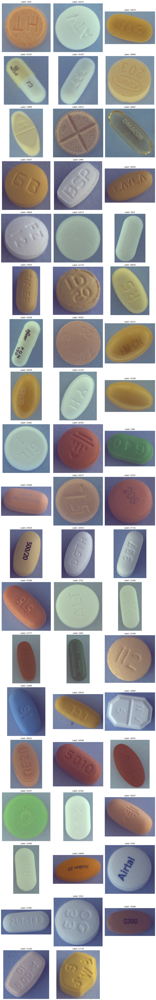

In [5]:
import matplotlib.pyplot as plt

# 1. 전체 행(Row) 개수 계산
total_items = len(unique_dict)
ncols = 3
nrows = (total_items + ncols - 1) // ncols  # 올림 계산

# 2. 서브플롯 생성
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows), squeeze=False)

# 딕셔너리를 리스트로 변환 (인덱싱을 위해)
items = list(unique_dict.items())

# 3. 반복문으로 axes.flat(그리드 칸)과 데이터 매칭
for i, ax in enumerate(axes.flat):
    if i < total_items:
        key, value = items[i]
        
        file_name = value[0]
        file_path = os.path.join(IMAGE_DIR, file_name)
        
        # bbox 좌표 (x, y, w, h)
        x, y, w, h = value[1]
        
        try:
            # 이미지 로드 (Tensor: C, H, W) -> permute -> (H, W, C)
            image_tensor = torchvision.io.read_image(file_path).permute(1, 2, 0)
            
            # 텐서 슬라이싱 (이미지 크롭)
            # 텐서는 정수 인덱싱이 필요하므로 int() 변환
            cropped_image = image_tensor[int(y):int(y+h), int(x):int(x+w)]
            
            # 출력
            ax.imshow(cropped_image)
            ax.set_title(f"Label: {key}")
            ax.axis('off')
            
        except Exception as e:
            # 파일이 없거나 에러 발생 시 빈 칸에 에러 메시지 표시
            ax.text(0.5, 0.5, f"Error:\n{key}", ha='center', va='center')
            ax.axis('off')
            print(f"Error processing {key}: {e}")
            
    else:
        # 남는 빈 칸 숨기기
        ax.axis('off')

plt.tight_layout()
plt.show()